In [52]:
import numpy as np
import cv2 #import OpenCV
import matplotlib.pyplot as plt
from skimage.filters.rank import entropy
from skimage.morphology import disk
import fnmatch
import os

workingpath="/home/cyril/liora/projet"
normal_files="/COVID-19_Radiography_Dataset/Normal"
covid_files="/COVID-19_Radiography_Dataset/COVID"
lungOpacity_files="/COVID-19_Radiography_Dataset/Lung_Opacity"
viralPneumonia_files="/COVID-19_Radiography_Dataset/Viral Pneumonia"
size_img=299
size_small_img=50


In [53]:

# read normal images and their masks, apply the masks to the images, resize them and stock them in a 3D array
nb_files_Normal=len(fnmatch.filter(os.listdir(workingpath+normal_files+"/images/"), "*.png"))
all_img_Normal = np.zeros((size_img, size_img, nb_files_Normal),  dtype=np.uint8)
all_img_Normal_without_mask = np.zeros((size_img, size_img, nb_files_Normal),  dtype=np.uint8)
all_small_Normal = np.zeros((size_small_img, size_small_img, nb_files_Normal),  dtype=np.uint8)
all_masks_Normal = np.zeros((size_img, size_img, nb_files_Normal),  dtype=np.uint8)
for i in range(0, nb_files_Normal):
    img_Normal = cv2.imread(workingpath+normal_files +"/images/Normal-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE)  
    img_Normal=cv2.equalizeHist(img_Normal)

    img_Normal_mask = cv2.imread(workingpath+normal_files +"/masks/Normal-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE) # pour lire

    img_mask_resized = cv2.resize(img_Normal_mask, (img_Normal.shape[0], img_Normal.shape[1]), 0, 0, cv2.INTER_NEAREST)
    img_Normal_and_mask = cv2.bitwise_and(img_Normal,img_mask_resized)
    img_Normal_and_mask_resized = cv2.resize(img_Normal_and_mask, (size_img, size_img), 0, 0, cv2.INTER_NEAREST)
    all_masks_Normal[:,:,i] = img_mask_resized
    all_img_Normal[:,:,i] = img_Normal_and_mask_resized
    all_small_Normal[:,:,i] = cv2.resize(img_Normal_and_mask_resized, (size_small_img, size_small_img), 0, 0, cv2.INTER_NEAREST)
    all_img_Normal_without_mask[:,:,i]=img_Normal








In [54]:
# read covid images and their masks, apply the masks to the images, resize them and stock them in a 3D array
nb_files_Covid=len(fnmatch.filter(os.listdir(workingpath+covid_files+"/images/"), "*.png"))
all_img_Covid = np.zeros((size_img, size_img, nb_files_Covid),  dtype=np.uint8)
all_small_Covid = np.zeros((size_small_img, size_small_img, nb_files_Covid),  dtype=np.uint8)
all_masks_Covid = np.zeros((size_img, size_img, nb_files_Covid),  dtype=np.uint8)
all_img_Covid_without_mask= np.zeros((size_img, size_img, nb_files_Covid),  dtype=np.uint8)
for i in range(0, nb_files_Covid):
    img_Covid = cv2.imread(workingpath+covid_files +"/images/COVID-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE)  
    img_Covid=cv2.equalizeHist(img_Covid)
    img_Covid_mask = cv2.imread(workingpath+covid_files +"/masks/COVID-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE) # pour lire

    img_mask_resized = cv2.resize(img_Covid_mask, (img_Covid.shape[0], img_Covid.shape[1]), 0, 0, cv2.INTER_NEAREST)
    img_Covid_and_mask = cv2.bitwise_and(img_Covid,img_mask_resized)
    img_Covid_and_mask_resized = cv2.resize(img_Covid_and_mask, (size_img, size_img), 0, 0, cv2.INTER_NEAREST)
    all_masks_Covid[:,:,i] = img_mask_resized
    all_img_Covid[:,:,i] = img_Covid_and_mask_resized
    all_small_Covid[:,:,i] = cv2.resize(img_Covid_and_mask_resized, (size_small_img, size_small_img), 0, 0, cv2.INTER_NEAREST)
    all_img_Covid_without_mask[:,:,i]=img_Covid
    

In [55]:
# read lung opacity images and their masks, apply the masks to the images, resize them and stock them in a 3D array
nb_files_LungOpacity=len(fnmatch.filter(os.listdir(workingpath+lungOpacity_files+"/images/"), "*.png"))
all_img_LungOpacity = np.zeros((size_img, size_img, nb_files_LungOpacity),  dtype=np.uint8)
all_small_LungOpacity = np.zeros((size_small_img, size_small_img, nb_files_LungOpacity),  dtype=np.uint8)
all_masks_LungOpacity = np.zeros((size_img, size_img, nb_files_LungOpacity),  dtype=np.uint8)
all_img_LungOpacity_without_mask = np.zeros((size_img, size_img, nb_files_LungOpacity),  dtype=np.uint8)
for i in range(0, nb_files_LungOpacity):
    img_LungOpacity = cv2.imread(workingpath+lungOpacity_files +"/images/Lung_Opacity-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE)  
    img_LungOpacity=cv2.equalizeHist(img_LungOpacity)
    img_LungOpacity_mask = cv2.imread(workingpath+lungOpacity_files +"/masks/Lung_Opacity-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE) # pour lire

    img_mask_resized = cv2.resize(img_LungOpacity_mask, (img_LungOpacity.shape[0], img_LungOpacity.shape[1]), 0, 0, cv2.INTER_NEAREST)
    img_LungOpacity_and_mask = cv2.bitwise_and(img_LungOpacity,img_mask_resized)
    img_LungOpacity_and_mask_resized = cv2.resize(img_LungOpacity_and_mask, (size_img, size_img), 0, 0, cv2.INTER_NEAREST)
    all_masks_LungOpacity[:,:,i] = img_mask_resized
    all_img_LungOpacity[:,:,i] = img_LungOpacity_and_mask_resized
    all_small_LungOpacity[:,:,i] = cv2.resize(img_LungOpacity_and_mask_resized, (size_small_img, size_small_img), 0, 0, cv2.INTER_NEAREST)
    all_img_LungOpacity_without_mask[:,:,i]=img_LungOpacity

In [56]:
# read viral pneumonia images and their masks, apply the masks to the images, resize them and stock them in a 3D array
nb_files_ViralPneumonia=len(fnmatch.filter(os.listdir(workingpath+viralPneumonia_files+"/images/"), "*.png"))
all_img_ViralPneumonia = np.zeros((size_img, size_img, nb_files_ViralPneumonia),  dtype=np.uint8)
all_small_ViralPneumonia = np.zeros((size_small_img, size_small_img, nb_files_ViralPneumonia),  dtype=np.uint8)
all_masks_ViralPneumonia= np.zeros((size_img, size_img, nb_files_ViralPneumonia),  dtype=np.uint8)
all_img_ViralPneumonia_without_mask = np.zeros((size_img, size_img, nb_files_ViralPneumonia),  dtype=np.uint8)
for i in range(0, nb_files_ViralPneumonia):
    img_ViralPneumonia = cv2.imread(workingpath+viralPneumonia_files +"/images/Viral Pneumonia-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE)  
    img_ViralPneumonia=cv2.equalizeHist(img_ViralPneumonia)
    img_ViralPneumonia_mask = cv2.imread(workingpath+viralPneumonia_files +"/masks/Viral Pneumonia-"+str(i+1)+".png", cv2.IMREAD_GRAYSCALE) # pour lire

    img_mask_resized = cv2.resize(img_ViralPneumonia_mask, (img_ViralPneumonia.shape[0], img_ViralPneumonia.shape[1]), 0, 0, cv2.INTER_NEAREST)
    img_ViralPneumonia_and_mask = cv2.bitwise_and(img_ViralPneumonia,img_mask_resized)
    img_ViralPneumonia_and_mask_resized = cv2.resize(img_ViralPneumonia_and_mask, (size_img, size_img), 0, 0, cv2.INTER_NEAREST)
    all_masks_ViralPneumonia[:,:,i] = img_mask_resized
    all_img_ViralPneumonia[:,:,i] = img_ViralPneumonia_and_mask_resized
    all_small_ViralPneumonia[:,:,i] = cv2.resize(img_ViralPneumonia_and_mask_resized, (size_small_img, size_small_img), 0, 0, cv2.INTER_NEAREST)
    all_img_ViralPneumonia_without_mask[:,:,i]=img_ViralPneumonia

In [57]:
print('nb_files_Normal:', all_img_Normal.shape[2])
print('nb_files_Covid:', all_img_Covid.shape[2])
print('nb_files_LungOpacity:', all_img_LungOpacity.shape[2])
print('nb_files_ViralPneumonia:', all_img_ViralPneumonia.shape[2])


nb_files_Normal: 10192
nb_files_Covid: 3616
nb_files_LungOpacity: 6012
nb_files_ViralPneumonia: 1345


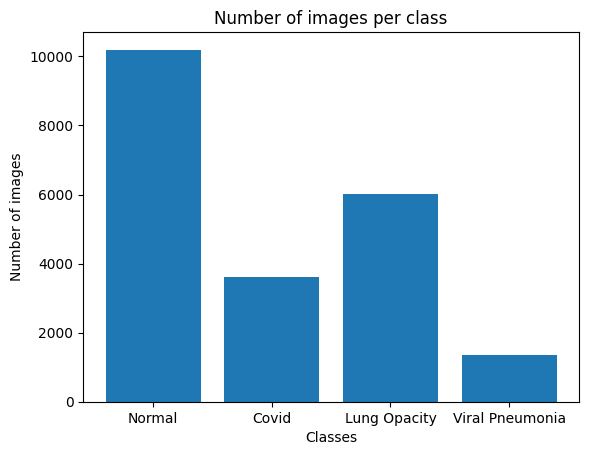

In [58]:
plt.bar([0, 1, 2, 3], [all_img_Normal.shape[2], all_img_Covid.shape[2], all_img_LungOpacity.shape[2], all_img_ViralPneumonia.shape[2]])
plt.xlabel('Classes')
plt.ylabel('Number of images')
plt.title('Number of images per class')
plt.xticks([0, 1, 2, 3], ['Normal', 'Covid', 'Lung Opacity', 'Viral Pneumonia'])
plt.show()

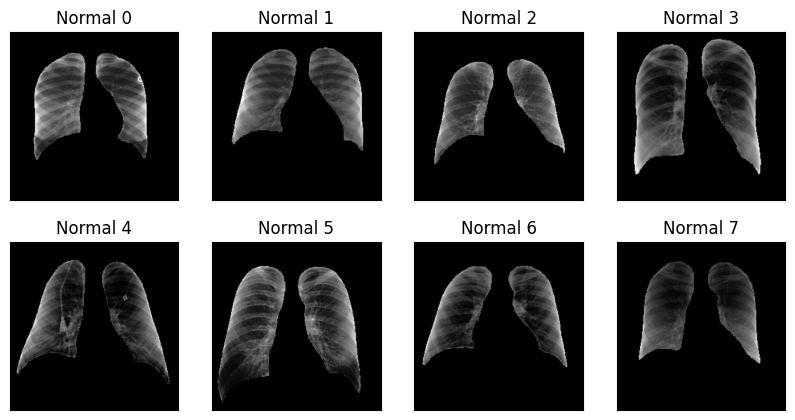

In [59]:

rows = 2
columns = 4
fig =  plt.figure(figsize = (10,5))

for i in range(0, rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title("Normal "+str(i))
    

Text(0.5, 1.0, 'mean of all normal images')

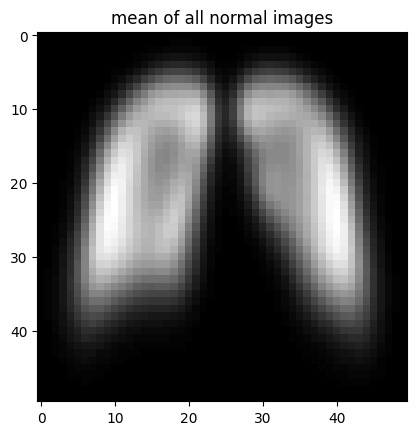

In [60]:
normalmean=np.mean(all_small_Normal, axis=2).astype("uint8")
plt.imshow(normalmean, cmap='gray');
plt.title("mean of all normal images")

Text(0.5, 1.0, 'median of all normal images')

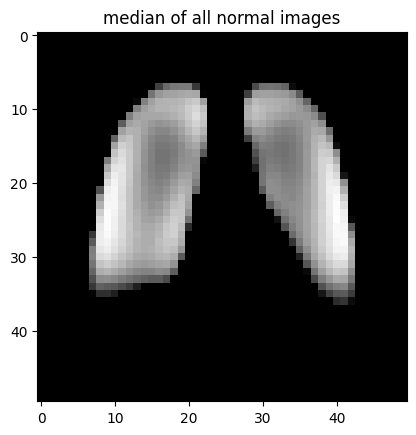

In [61]:
normalmedian=np.median(all_small_Normal, axis=2).astype("uint8")
plt.imshow(normalmedian, cmap='gray');
plt.title("median of all normal images")


In [62]:
def mse(imageA, imageB):
   
    assert imageA.shape == imageB.shape, "Images must be the same size."
  
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])

    return err


all_normal_mse=[]
for i in range(0, nb_files_Normal):
    
    diff= mse(normalmean, all_small_Normal[:,:,i])
    all_normal_mse.append(diff)



Text(0.5, 1.0, 'mse between each normal image and the mean of all normal images')

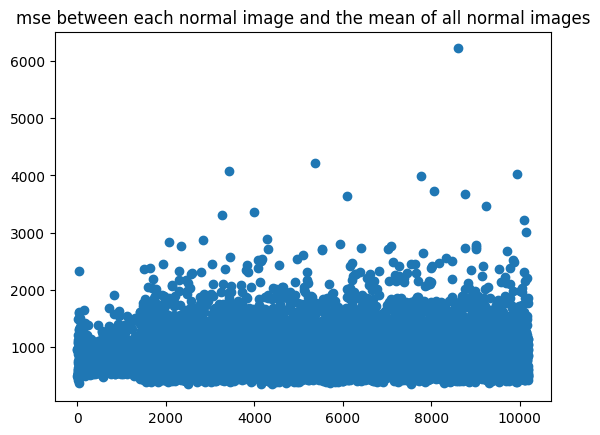

In [63]:
#print(len(all_normal_mse))
plt.scatter(range(0, len(all_normal_mse)), all_normal_mse)
plt.title("mse between each normal image and the mean of all normal images")

In [64]:
all_normal_mse_arr = np.array(all_normal_mse)
values_outliers_normal=np.where(all_normal_mse_arr > 2500)[0]
print("indices éloignés:",values_outliers_normal)





indices éloignés: [ 2066  2332  2847  3270  3422  3459  3983  4076  4175  4294  4310  4954
  5104  5367  5521  5536  5946  6089  6410  7031  7079  7770  7806  8063
  8327  8593  8753  8763  9001  9002  9012  9231  9705  9845  9932 10090
 10142]


In [65]:

values_proche_normal=np.where(all_normal_mse_arr<400)[0]
print("indices proche :",values_proche_normal)


indices proche : [  40 1545 1552 1667 1813 1830 1835 2043 2055 2130 2205 2447 2490 2699
 2891 3019 3140 3314 3443 3476 3540 3929 3937 4158 4198 4299 4360 4398
 4492 4567 4707 4885 4960 5012 5616 5632 5713 5820 5883 5980 5994 6014
 6329 6691 6707 6779 6846 6905 7151 7239 7533 7852 8286 8431 8443 8445
 8652 8858 8879 8984 9313 9362 9519 9754 9893 9915 9944]


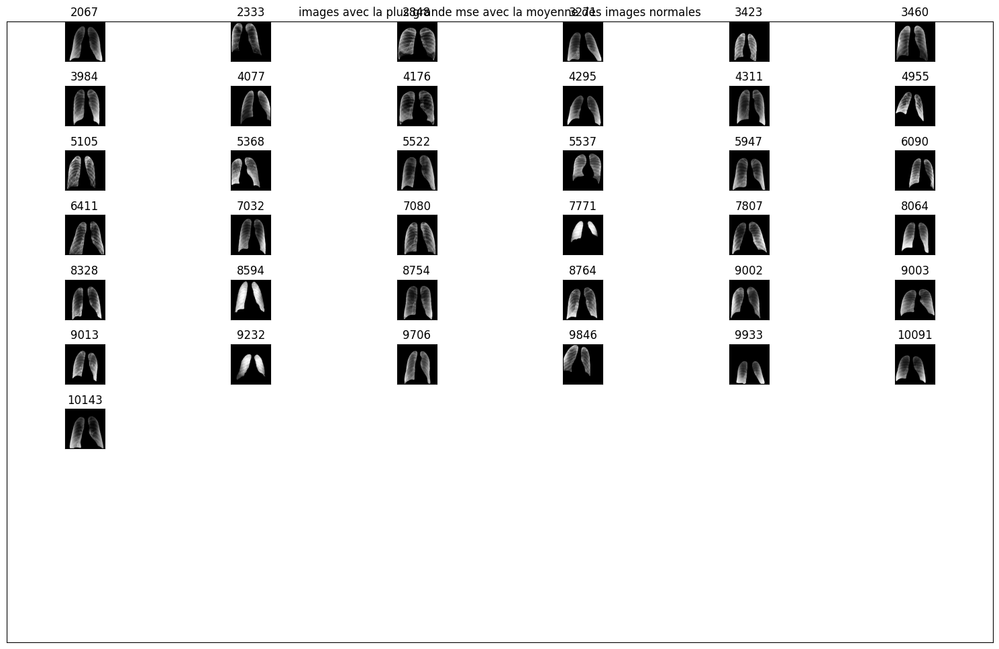

In [ ]:
fig =  plt.figure(figsize = (15,10))
plt.title("images avec la plus grande mse avec la moyenne des images normales")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = len(values_outliers_normal)//4+1
j=1
plt.tight_layout()

for i in values_outliers_normal :
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1




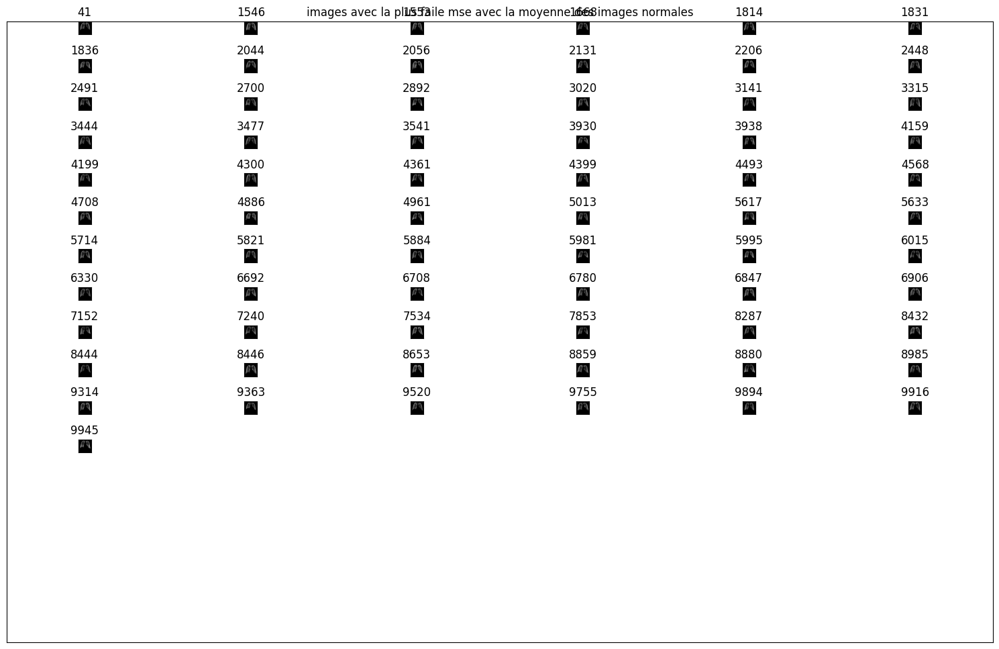

In [ ]:
fig =  plt.figure(figsize = (20,20))
plt.title("images avec la plus faile mse avec la moyenne des images normales")
plt.xticks([]);
plt.yticks([]);
columns = 6
plt.tight_layout()
rows = len(values_proche_normal)//4+1
j=1

for i in values_proche_normal :
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1


In [68]:
####### FIN NORMAL et DEBUT COVID ########

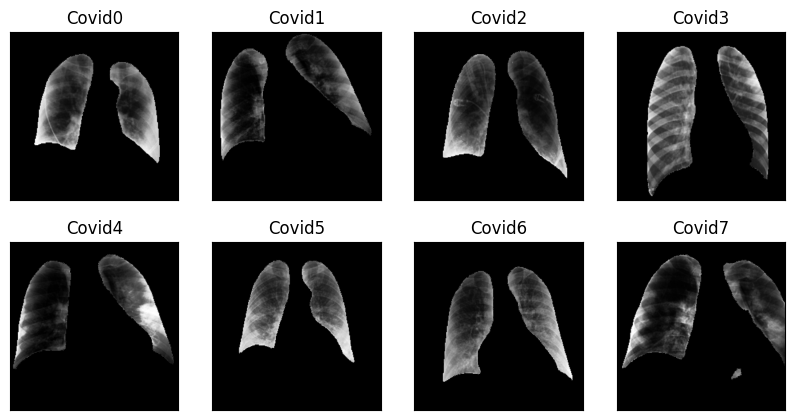

In [69]:
rows = 2
columns = 4
fig =  plt.figure(figsize = (10,5))

for i in range(0, rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title("Covid"+str(i))

Text(0.5, 1.0, 'mean of all covid images')

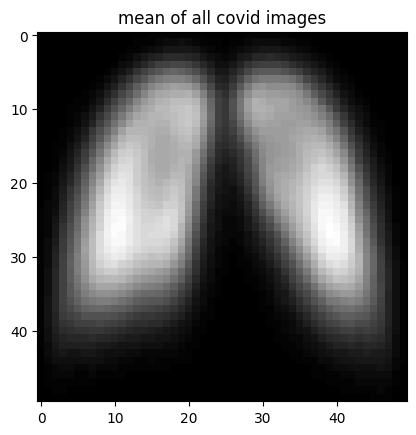

In [70]:
covidmean=np.mean(all_small_Covid, axis=2).astype("uint8")
plt.imshow(covidmean, cmap='gray');
plt.title("mean of all covid images")

Text(0.5, 1.0, 'median of all covid images')

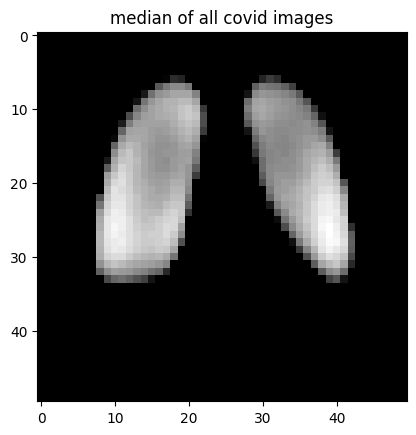

In [71]:
covidmedian=np.median(all_small_Covid, axis=2).astype("uint8")
plt.imshow(covidmedian, cmap='gray');
plt.title("median of all covid images")

In [72]:
all_covid_mse=[]
for i in range(0, nb_files_Covid):
    
    diff= mse(covidmean, all_small_Covid[:,:,i])
    all_covid_mse.append(diff)

682.494


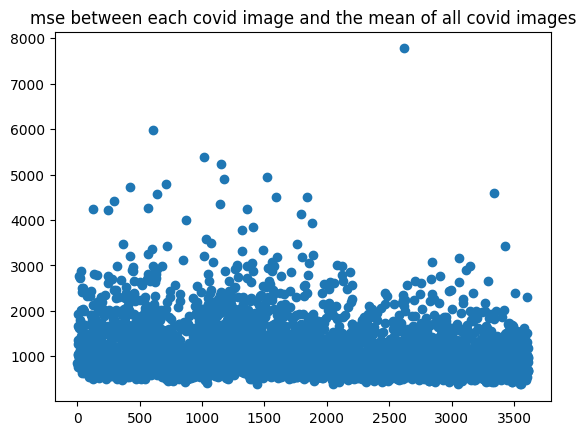

In [73]:
plt.scatter(range(0, len(all_covid_mse)), all_covid_mse)
plt.title("mse between each covid image and the mean of all covid images")

print(all_covid_mse[3615])

In [74]:
all_covid_mse_arr = np.array(all_covid_mse)
mask = all_covid_mse_arr > 4000
values_outliers_covid=np.where(mask)[0]
print("indices:",values_outliers_covid)



indices: [ 122  246  296  421  566  606  635  711  872 1016 1147 1155 1178 1361
 1522 1595 1789 1842 2617 3341]


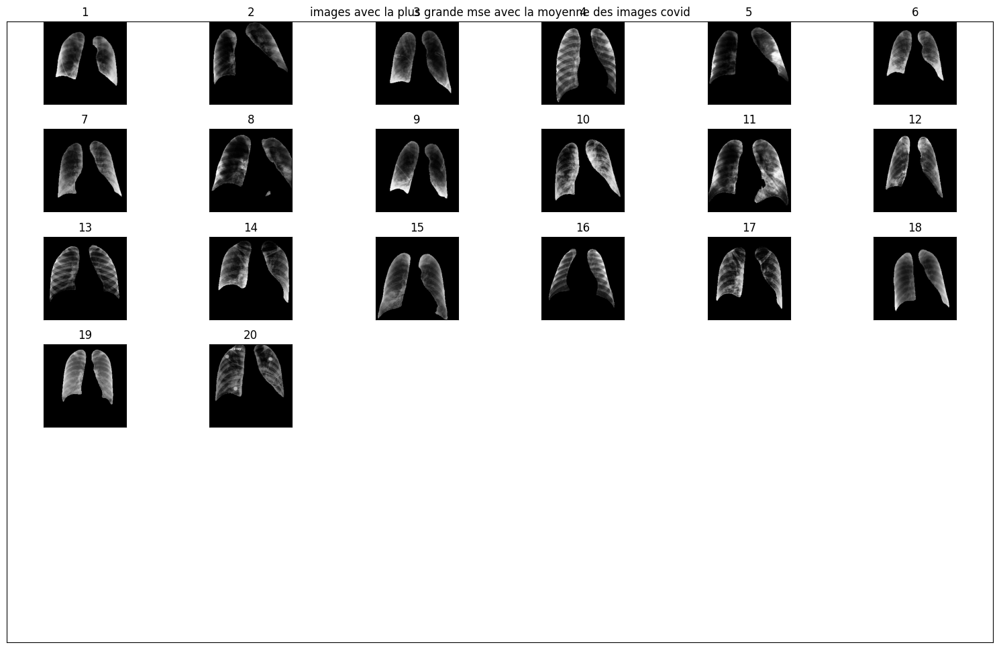

In [75]:
fig =  plt.figure(figsize = (15,10))
plt.title("images avec la plus grande mse avec la moyenne des images covid")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = len(values_outliers_covid)//4+1
j=1

for i in range(0, len(values_outliers_covid)):
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

In [76]:
##### FIN COVID et DEBUT LUNG OPACITY ####

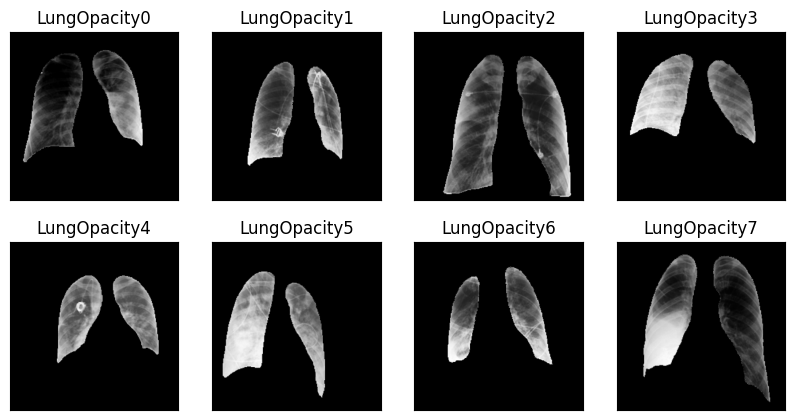

In [77]:
rows = 2
columns = 4
fig =  plt.figure(figsize = (10,5))

for i in range(0, rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title("LungOpacity"+str(i))


Text(0.5, 1.0, 'mean of all lung opacity images')

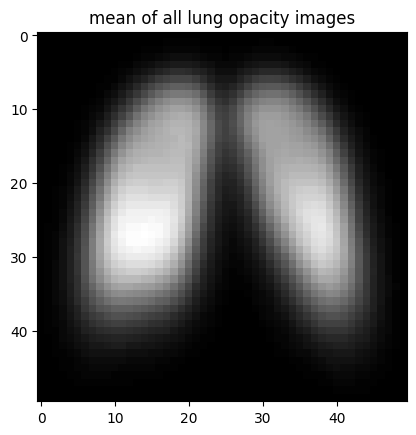

In [78]:
lungOpacitymean=np.mean(all_small_LungOpacity, axis=2).astype("uint8")
plt.imshow(lungOpacitymean, cmap='gray');
plt.title("mean of all lung opacity images")

Text(0.5, 1.0, 'median of all lung opacity images')

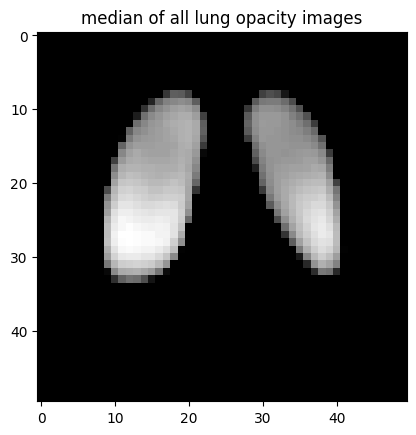

In [79]:
lungOpacitymedian=np.median(all_small_LungOpacity, axis=2).astype("uint8")
plt.imshow(lungOpacitymedian, cmap='gray');
plt.title("median of all lung opacity images")

In [80]:
all_lungOpacity_mse=[]
for i in range(0, nb_files_LungOpacity):
    
    diff= mse(lungOpacitymean, all_small_LungOpacity[:,:,i])
    all_lungOpacity_mse.append(diff)

Text(0.5, 1.0, 'mse between each lung opacity image and the mean of all lung opacity images')

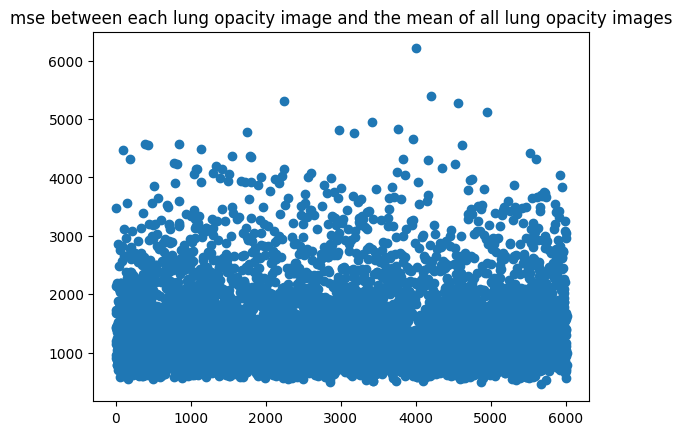

In [81]:
plt.scatter(range(0, len(all_lungOpacity_mse)), all_lungOpacity_mse)
plt.title("mse between each lung opacity image and the mean of all lung opacity images")

In [82]:
all_lungOpacity_mse_arr = np.array(all_lungOpacity_mse)
mask = all_lungOpacity_mse_arr > 4000
values_outliers_lungOpacity=np.where(mask)[0]
print("indices:",values_outliers_lungOpacity)

indices: [  90  196  383  435  778  822  840 1038 1073 1082 1133 1298 1331 1416
 1514 1554 1752 1787 1800 1936 2221 2236 2242 2563 2599 2970 3176 3415
 3749 3766 3824 3854 3965 4003 4161 4204 4343 4517 4561 4612 4942 5517
 5600 5923]


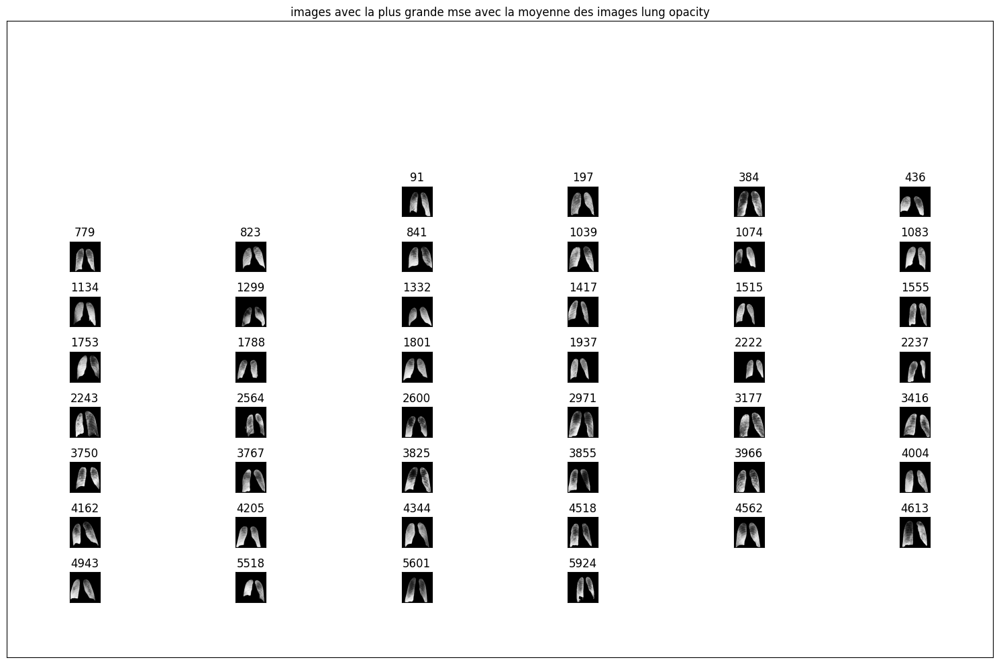

In [83]:
fig =  plt.figure(figsize = (15,10))
plt.title("images avec la plus grande mse avec la moyenne des images lung opacity")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = len(values_outliers_lungOpacity)//4+1
j+1

for i in values_outliers_lungOpacity:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

In [84]:
##### fin lung opacity et debut viral pneumonia ####

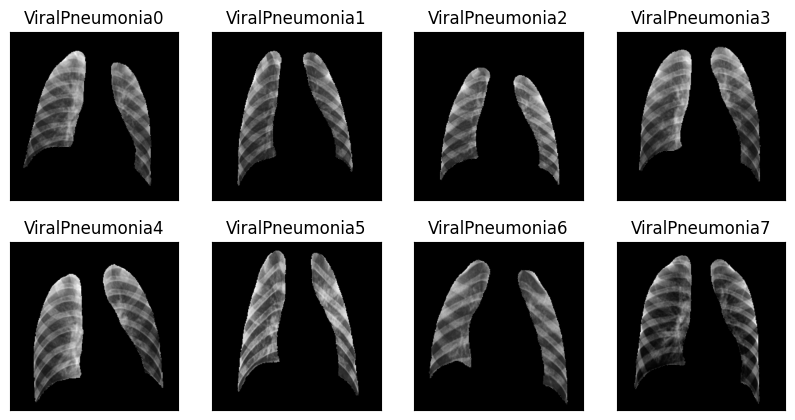

In [85]:
rows = 2
columns = 4
fig =  plt.figure(figsize = (10,5));

for i in range(0, rows*columns):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title("ViralPneumonia"+str(i));

Text(0.5, 1.0, 'mean of all viral pneumonia images')

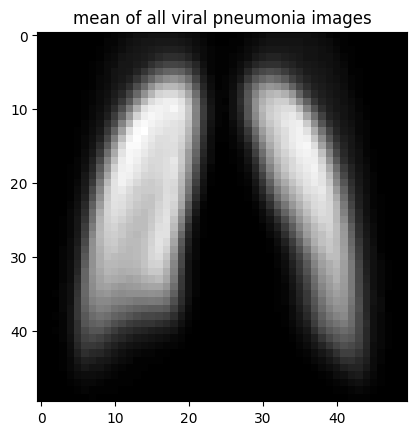

In [86]:
ViralPneumoniamean=np.mean(all_small_ViralPneumonia, axis=2).astype("uint8")
plt.imshow(ViralPneumoniamean, cmap='gray');
plt.title("mean of all viral pneumonia images")

Text(0.5, 1.0, 'median of all viral pneumonia images')

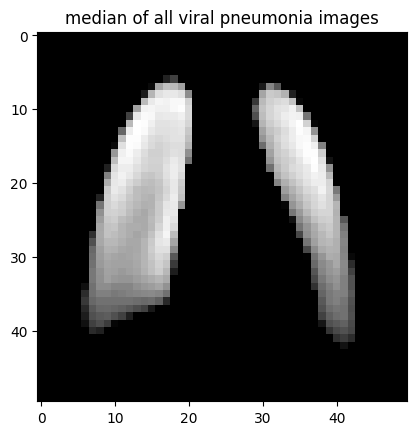

In [87]:
ViralPneumoniamedian=np.median(all_small_ViralPneumonia, axis=2).astype("uint8")
plt.imshow(ViralPneumoniamedian, cmap='gray');
plt.title("median of all viral pneumonia images")

In [88]:
all_ViralPneumonia_mse=[]
for i in range(0, nb_files_ViralPneumonia):
    
    diff= mse(ViralPneumoniamean, all_small_ViralPneumonia[:,:,i])
    all_ViralPneumonia_mse.append(diff)

Text(0.5, 1.0, 'mse between each viral pneumonia image and the mean of all viral pneumonia images')

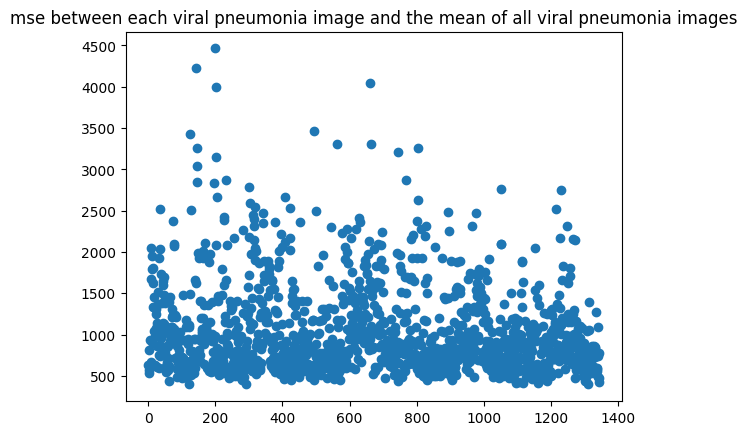

In [89]:
plt.scatter(range(0, len(all_ViralPneumonia_mse)), all_ViralPneumonia_mse)
plt.title("mse between each viral pneumonia image and the mean of all viral pneumonia images")

In [90]:
all_ViralPneumonia_mse_arr = np.array(all_ViralPneumonia_mse)
mask = all_ViralPneumonia_mse_arr > 3000
values_outliers_ViralPneumonia=np.where(mask)[0]
print("indices:",values_outliers_ViralPneumonia)

indices: [125 143 144 146 200 201 202 494 562 662 663 744 805]


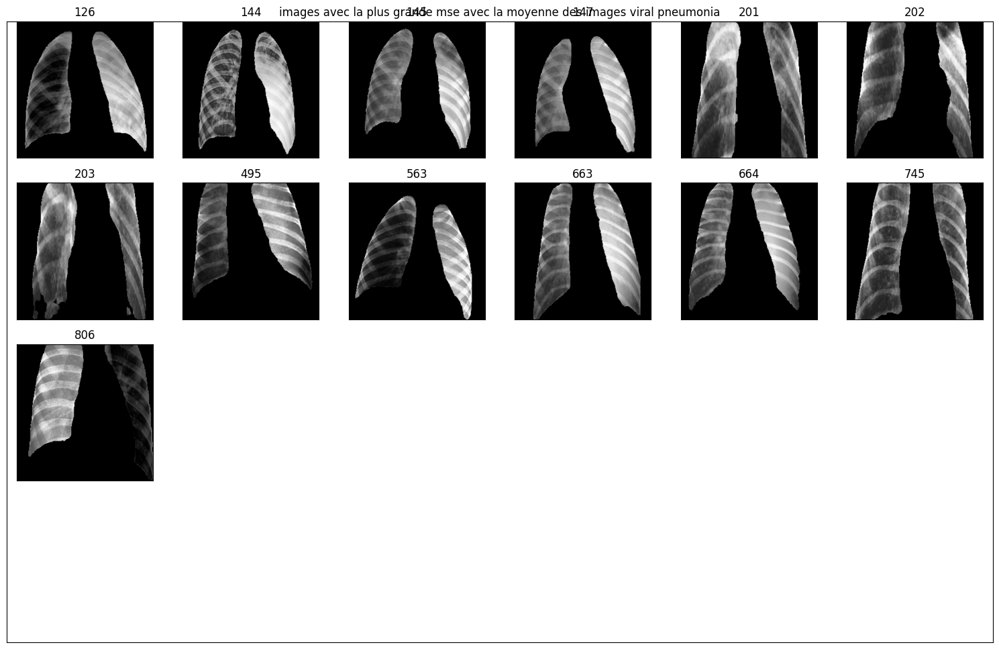

In [91]:
fig =  plt.figure(figsize = (15,10))
plt.title("images avec la plus grande mse avec la moyenne des images viral pneumonia")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = len(values_outliers_ViralPneumonia)//4+1
j=1

for i in values_outliers_ViralPneumonia:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

In [92]:
# analyse avec traitement d'images

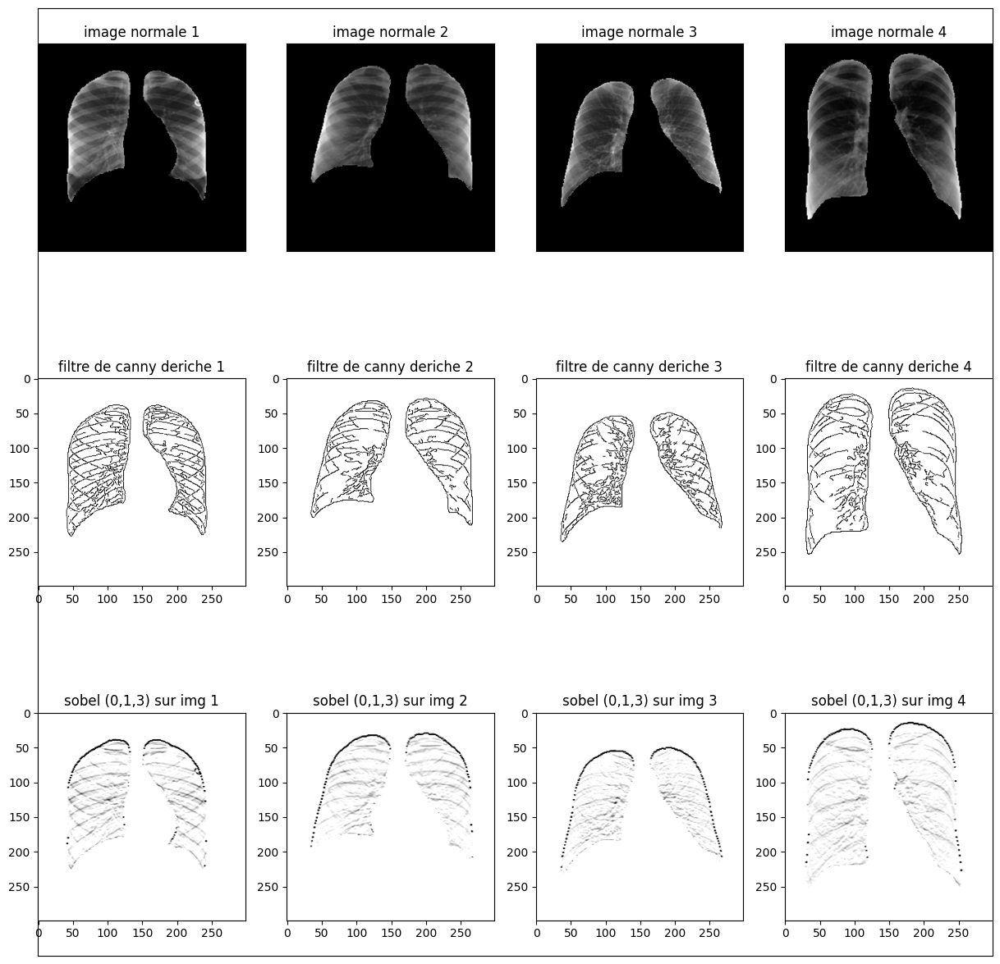

In [93]:

fig =  plt.figure(figsize = (15,15))
plt.xticks([]);
plt.yticks([]);
columns = 4
rows = 3

for i in range(0, 4):

    img_edges = cv2.Canny(all_img_Normal[:,:,i],50,100)
    img_mask_edges = cv2.Canny(all_masks_Normal[:,:,i],50,100)
    img_edges_minus_masks = cv2.bitwise_not(img_edges,img_mask_edges)
    
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.title("image normale " + str(i+1))
    plt.xticks([]);
    plt.yticks([]);
    
    fig.add_subplot(rows, columns, i+5)
    plt.imshow(img_edges_minus_masks, cmap='gray');
    plt.title("filtre de canny deriche " + str(i+1))

    fig.add_subplot(rows, columns, i+1+2*columns)
    filteredsobel = cv2.Sobel(all_img_Normal[:,:,i], cv2.CV_8U, 0, 1, ksize = 3)
    filteredsobel = cv2.bitwise_not(filteredsobel,img_mask_edges)
    plt.imshow(filteredsobel, cmap='gray');
    plt.title("sobel (0,1,3) sur img " + str(i+1))

    

    

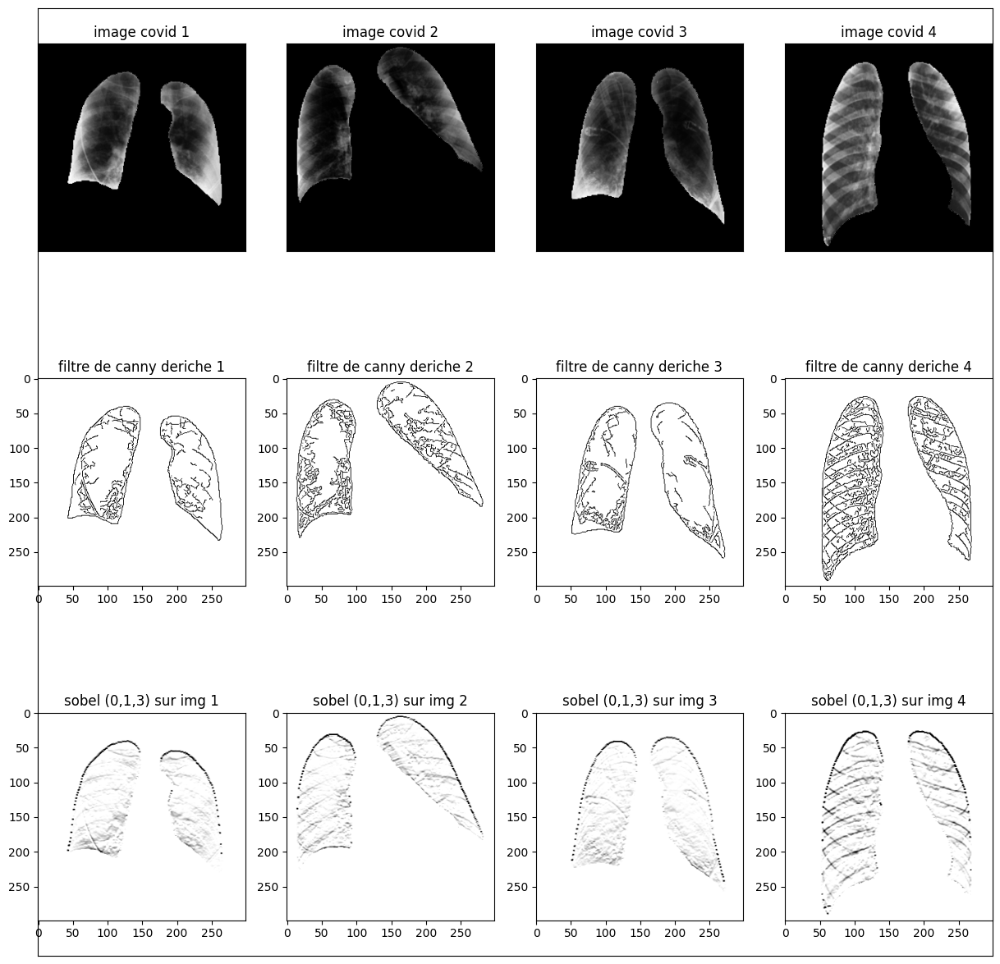

In [94]:
fig =  plt.figure(figsize = (15,15))
plt.xticks([]);
plt.yticks([]);
columns = 4
rows = 3

for i in range(0, 4):

    img_edges = cv2.Canny(all_img_Covid[:,:,i],50,100)
    img_mask_edges = cv2.Canny(all_masks_Covid[:,:,i],50,100)
    img_edges_minus_masks = cv2.bitwise_not(img_edges,img_mask_edges)
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.title("image covid " + str(i+1))
    plt.xticks([]);
    plt.yticks([]);
    fig.add_subplot(rows, columns, i+5)
    plt.imshow(img_edges_minus_masks, cmap='gray');
    plt.title("filtre de canny deriche " + str(i+1))

    fig.add_subplot(rows, columns, i+1+2*columns)
    filteredsobel = cv2.Sobel(all_img_Covid[:,:,i], cv2.CV_8U, 0, 1, ksize = 3)
    filteredsobel = cv2.bitwise_not(filteredsobel,img_mask_edges)
    plt.imshow(filteredsobel, cmap='gray');
    plt.title("sobel (0,1,3) sur img " + str(i+1))

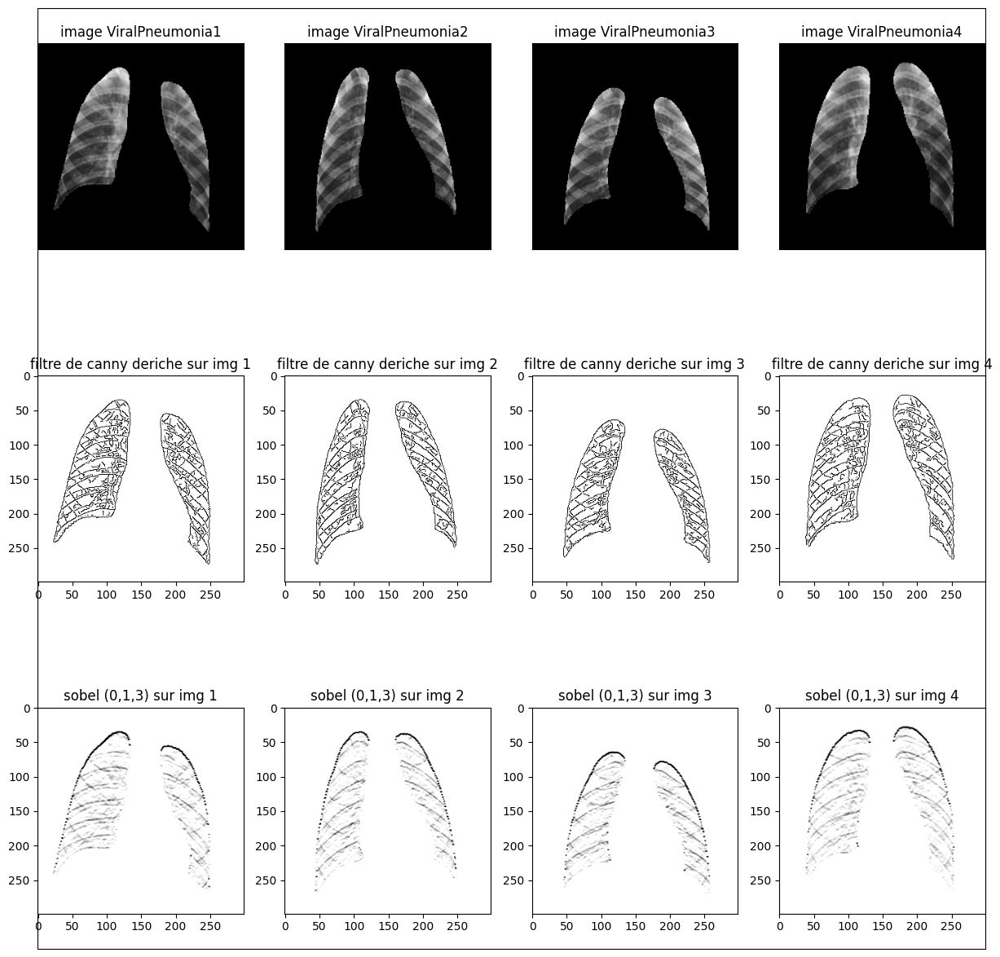

In [95]:
fig =  plt.figure(figsize = (15,15))
plt.xticks([]);
plt.yticks([]);
columns = 4
rows = 3

for i in range(0, 4):

    img_edges = cv2.Canny(all_img_ViralPneumonia[:,:,i],50,100)
    img_mask_edges = cv2.Canny(all_masks_ViralPneumonia[:,:,i],50,100)
    img_edges_minus_masks = cv2.bitwise_not(img_edges,img_mask_edges)
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.title("image ViralPneumonia" + str(i+1))
    plt.xticks([]);
    plt.yticks([]);
    fig.add_subplot(rows, columns, i+5)
    plt.imshow(img_edges_minus_masks, cmap='gray');
    plt.title("filtre de canny deriche sur img " + str(i+1))

    fig.add_subplot(rows, columns, i+1+2*columns)
    filteredsobel = cv2.Sobel(all_img_ViralPneumonia[:,:,i], cv2.CV_8U, 0, 1, ksize = 3)
    filteredsobel = cv2.bitwise_not(filteredsobel,img_mask_edges)
    plt.imshow(filteredsobel, cmap='gray');
    plt.title("sobel (0,1,3) sur img " + str(i+1))

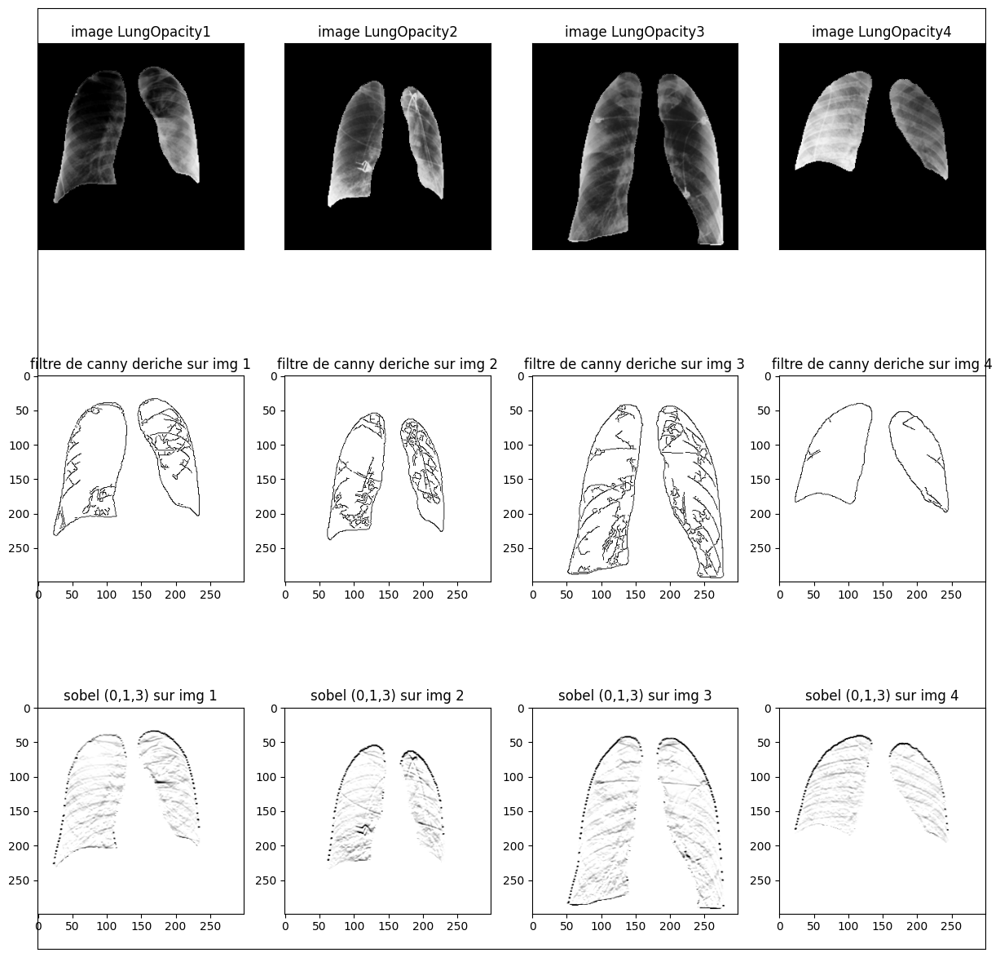

In [96]:
fig =  plt.figure(figsize = (15,15))
plt.xticks([]);
plt.yticks([]);
columns = 4
rows = 3

for i in range(0, 4):

    img_edges = cv2.Canny(all_img_LungOpacity[:,:,i],50,200)
    img_mask_edges = cv2.Canny(all_masks_LungOpacity[:,:,i],50,200)
    img_edges_minus_masks = cv2.bitwise_not(img_edges,img_mask_edges)
    img_edges_minus_masks_blur = cv2.GaussianBlur(img_edges_minus_masks,(9,9),3,4)
    img_test = cv2.bitwise_and(all_img_LungOpacity[:,:,i],img_edges_minus_masks_blur)

    fig.add_subplot(rows, columns, i+1)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.title("image LungOpacity" + str(i+1))
    plt.xticks([]);
    plt.yticks([]);

    fig.add_subplot(rows, columns, i+1+columns)
    plt.imshow(img_edges_minus_masks, cmap='gray');
    plt.title("filtre de canny deriche sur img " + str(i+1))

    fig.add_subplot(rows, columns, i+1+2*columns)
    filteredsobel = cv2.Sobel(all_img_LungOpacity[:,:,i], cv2.CV_8U, 0, 1, ksize = 3)
    filteredsobel = cv2.bitwise_not(filteredsobel,img_mask_edges)
    plt.imshow(filteredsobel, cmap='gray');
    plt.title("sobel (0,1,3) sur img " + str(i+1))

In [97]:
# detection des images floues Normal

variance_laplacien_Normal=[]
for i in range(0, nb_files_Normal):

    variance_laplacien_Normal.append(cv2.Laplacian(all_img_Normal_without_mask[:,:,i], cv2.CV_64F).var())

    # detection des images floues Covid

variance_laplacien_Covid=[]
for i in range(0, nb_files_Covid):

    variance_laplacien_Covid.append(cv2.Laplacian(all_img_Covid_without_mask[:,:,i], cv2.CV_64F).var())


# detection des images floues Lung Opacity

variance_laplacien_LungOpacity=[]
for i in range(0, nb_files_LungOpacity):

    variance_laplacien_LungOpacity.append(cv2.Laplacian(all_img_LungOpacity_without_mask[:,:,i], cv2.CV_64F).var())


# detection des images floues Viral Pneumo

variance_laplacien_ViralPneumonia=[]
for i in range(0, nb_files_ViralPneumonia):

    variance_laplacien_ViralPneumonia.append(cv2.Laplacian(all_img_ViralPneumonia_without_mask[:,:,i], cv2.CV_64F).var())



Text(0.5, 1.0, 'variance laplacien Viral Pneumonia = flou ')

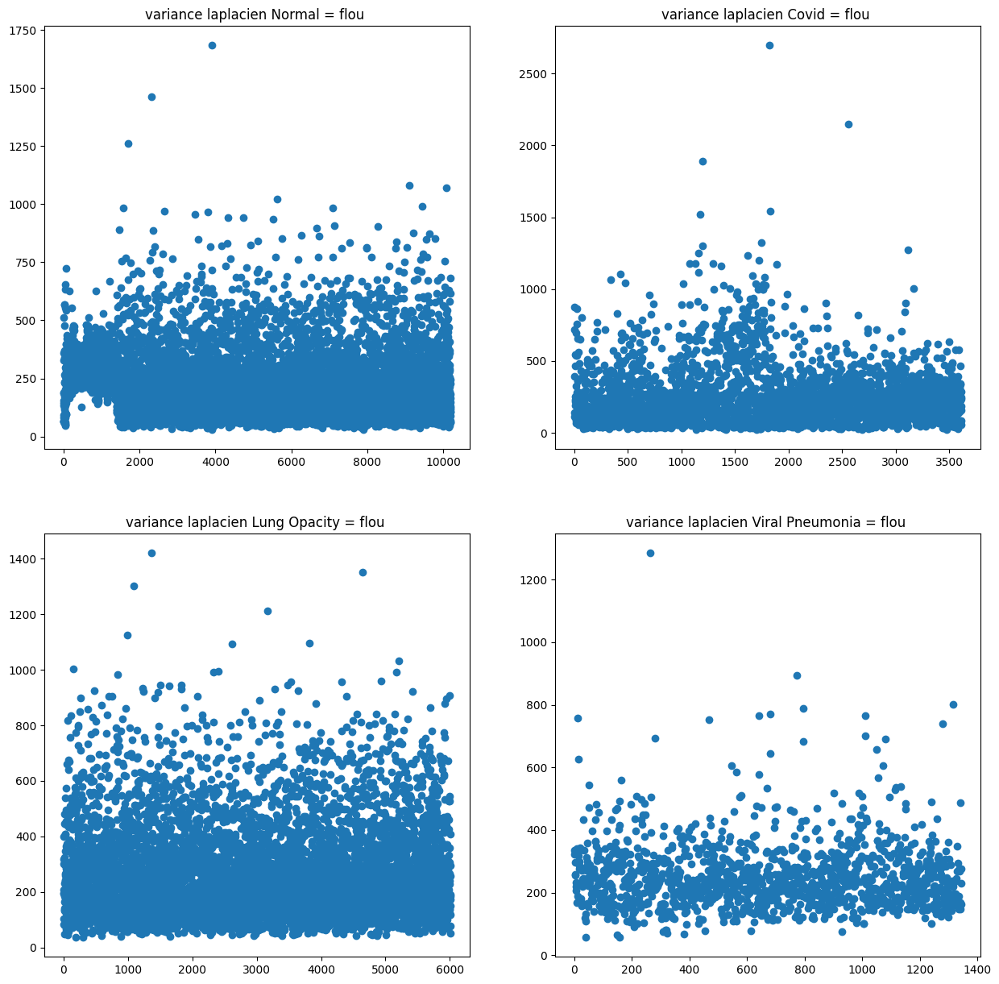

In [98]:
fig =  plt.figure(figsize = (15,15)) 
plt.subplot(2,2,1)
plt.scatter(range(0, nb_files_Normal),variance_laplacien_Normal)
plt.title("variance laplacien Normal = flou ")
plt.subplot(2,2,2)
plt.scatter(range(0, nb_files_Covid),variance_laplacien_Covid)
plt.title("variance laplacien Covid = flou ")
plt.subplot(2,2,3)
plt.scatter(range(0, nb_files_LungOpacity),variance_laplacien_LungOpacity)
plt.title("variance laplacien Lung Opacity = flou ")
plt.subplot(2,2,4)
plt.scatter(range(0, nb_files_ViralPneumonia),variance_laplacien_ViralPneumonia)
plt.title("variance laplacien Viral Pneumonia = flou ")

In [99]:
variance_laplacien_normal_arr = np.array(variance_laplacien_Normal)
maskNormal = variance_laplacien_normal_arr < 45
outliers_variance_laplacien_normal=np.where(maskNormal)[0]
print("indices flous cas normaux :",outliers_variance_laplacien_normal+1)

variance_laplacien_Covid_arr = np.array(variance_laplacien_Covid)
maskCovid = variance_laplacien_Covid_arr < 30
outliers_variance_laplacien_Covid=np.where(maskCovid)[0]
print("indices flous cas covid :",outliers_variance_laplacien_Covid+1)

variance_laplacien_LungOpacity_arr = np.array(variance_laplacien_LungOpacity)
maskLungOpacity = variance_laplacien_LungOpacity_arr < 50
outliers_variance_laplacien_LungOpacity=np.where(maskLungOpacity)[0]
print("indices flous cas Lung Opacity :",outliers_variance_laplacien_LungOpacity+1)

variance_laplacien_ViralPneumonia_arr = np.array(variance_laplacien_ViralPneumonia)
maskViralPneumonia = variance_laplacien_ViralPneumonia_arr < 80
outliers_variance_laplacien_ViralPneumonia=np.where(maskViralPneumonia)[0]
print("indices flous cas Viral Pneumonia:",outliers_variance_laplacien_ViralPneumonia+1)

indices flous cas normaux : [ 1485  1530  1591  1834  2287  2857  3068  3117  3251  3336  3341  3344
  3777  3795  3872  3906  3921  4355  4820  4869  5188  5207  5224  5400
  5411  5422  5545  5674  6128  6209  6811  7213  7383  7501  7516  7619
  7634  7764  7826  7859  7887  7932  8217  8295  8694  8729  8749  9147
  9381  9390  9997 10146]
indices flous cas covid : [ 324  500  585 1141 1401 1413 1553 1703 1730 1740 1742 2471 2492 2493
 2647 2688 2750 3480 3584]
indices flous cas Lung Opacity : [  12   66  191  306  588  889 1212 1657 2282 2617 2731 2959 2982 3395
 3560 3570 3608 4351 4540 4776 4791 4871 4872 5013]
indices flous cas Viral Pneumonia: [ 41 150 158 309 323 382 454 613 929]


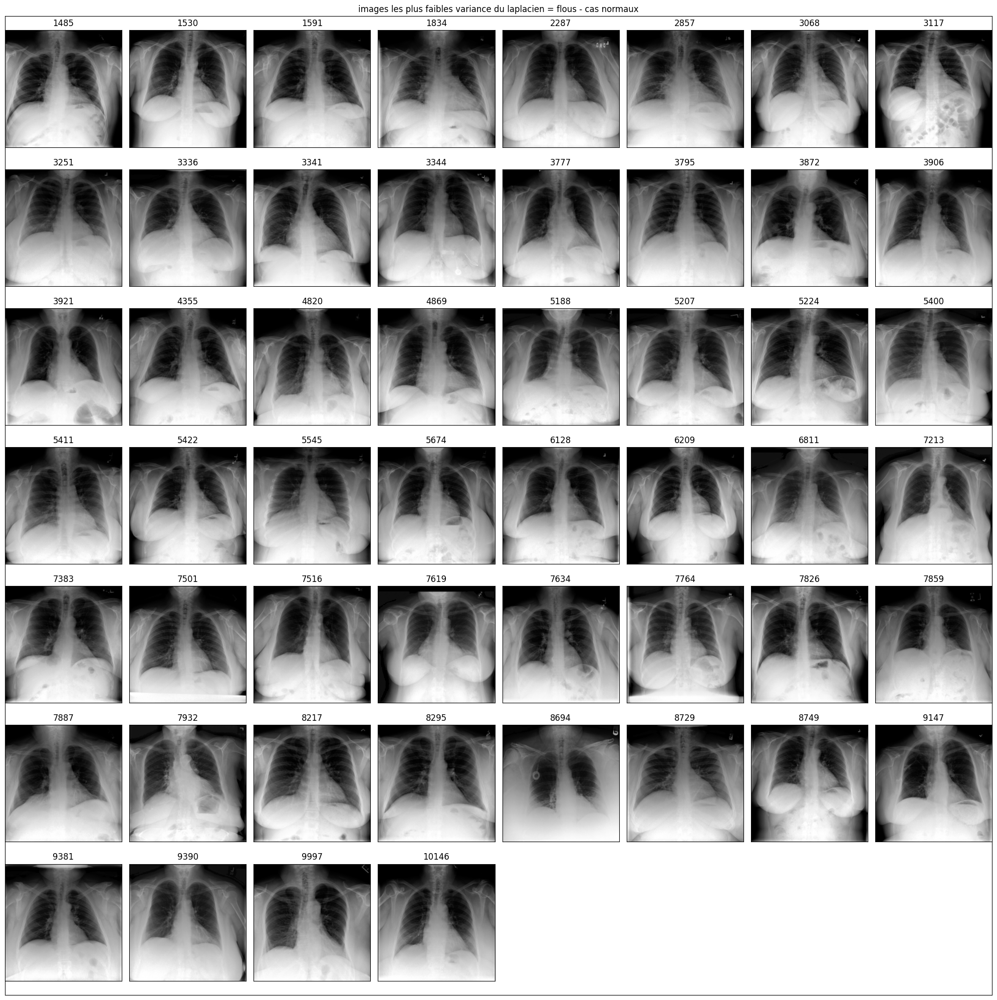

In [100]:

fig =  plt.figure(figsize = (20,20))

#  normal
plt.title("images les plus faibles variance du laplacien = flous - cas normaux")
plt.xticks([]);
plt.yticks([]);
columns = 8
rows = np.ceil(len(outliers_variance_laplacien_normal)//columns+1)
j=1

for i in outliers_variance_laplacien_normal:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal_without_mask[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1





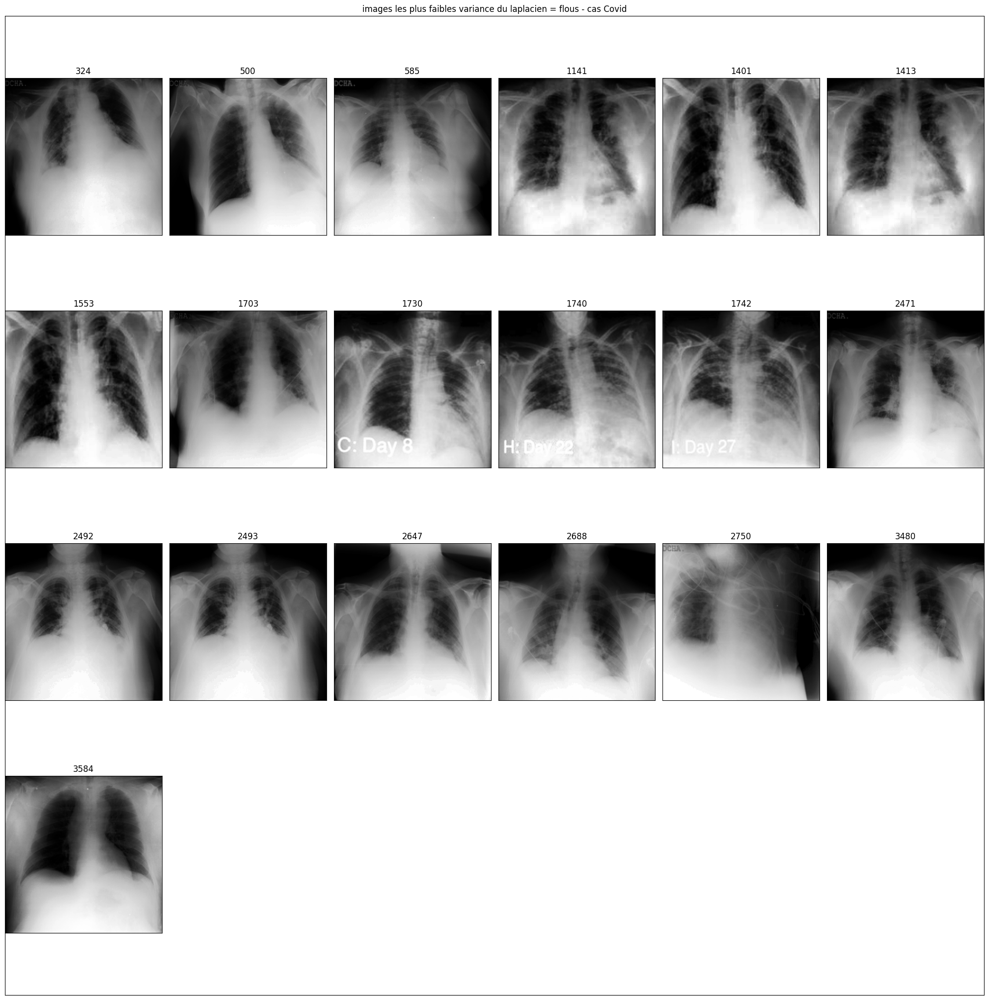

In [101]:
#  covid
fig =  plt.figure(figsize = (20,20))
plt.title("images les plus faibles variance du laplacien = flous - cas Covid")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = np.ceil(len(outliers_variance_laplacien_Covid)//columns+1)
j=1

for i in outliers_variance_laplacien_Covid:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Covid_without_mask[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

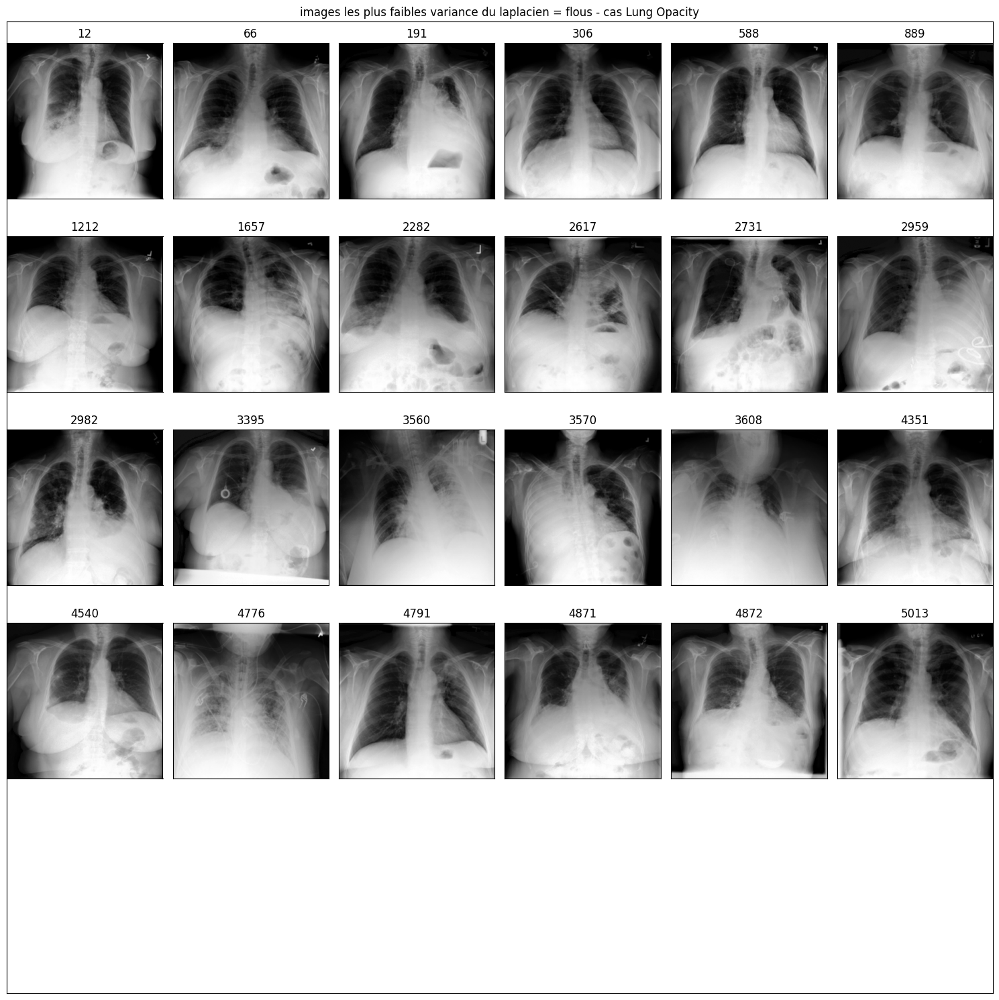

In [102]:
# LungOpacity
fig =  plt.figure(figsize = (15,15))
plt.title("images les plus faibles variance du laplacien = flous - cas Lung Opacity")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = np.ceil(len(outliers_variance_laplacien_LungOpacity)//columns+1)
j=1

for i in outliers_variance_laplacien_LungOpacity:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_LungOpacity_without_mask[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

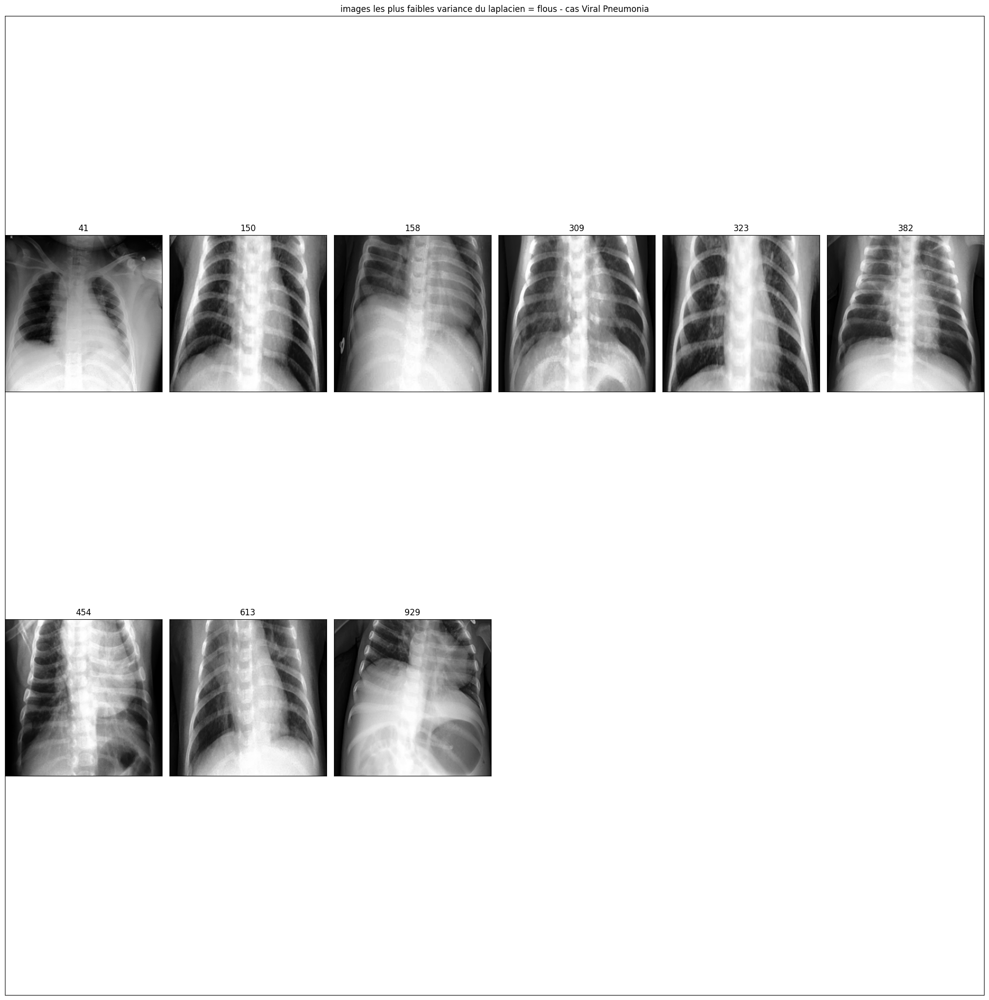

In [103]:
# Viral Pneumonia
fig =  plt.figure(figsize = (20,20))
plt.title("images les plus faibles variance du laplacien = flous - cas Viral Pneumonia")
plt.xticks([]);
plt.yticks([]);
columns = 6
rows = np.ceil(len(outliers_variance_laplacien_ViralPneumonia)//columns+1)
j=1

for i in outliers_variance_laplacien_ViralPneumonia:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_ViralPneumonia_without_mask[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

[4212, 8690, 2000, 4205, 6777, 5336, 8886, 2880, 1939, 8315, 3522, 5007, 5437, 9810, 7853, 1950, 7858, 9056, 1536, 3920]


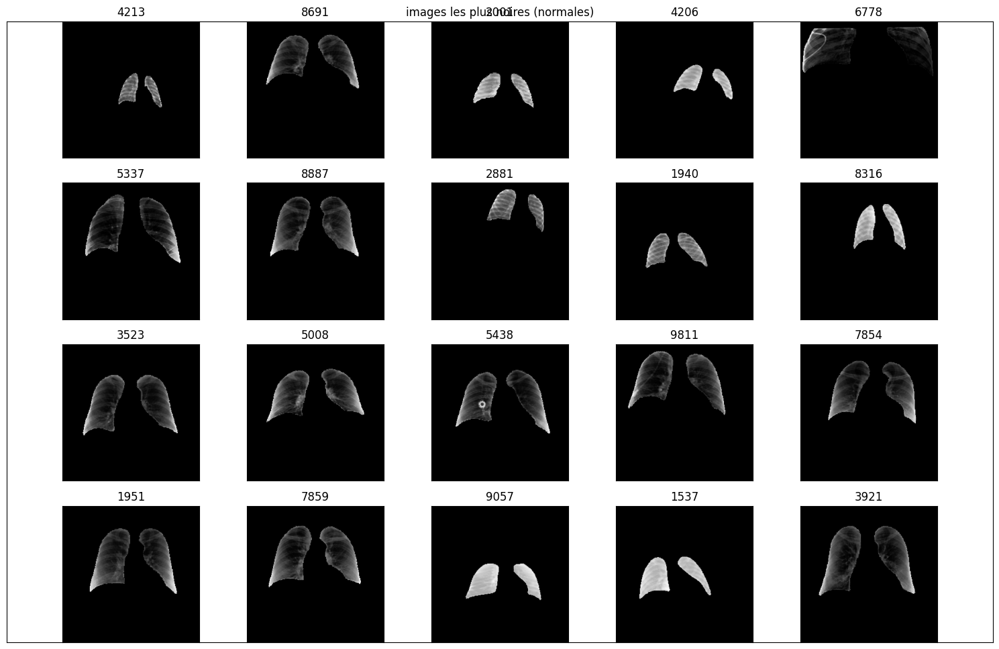

In [104]:
# detection des images ou il y a beaucoup de noir (normales)

fig =  plt.figure(figsize = (15,10))
plt.title("images les plus noires (normales)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

black_Normal=[]
for i in range(0, nb_files_Normal):
    
    black_Normal.append(sum(sum(all_img_Normal[:,:,i]>40)))

black_Normal_ids=np.argsort(black_Normal)[:20].tolist()

print(black_Normal_ids)
j=1

for i in black_Normal_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Normal[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1


[3614, 1672, 2633, 1554, 1183, 1674, 2110, 2557, 1764, 3007, 1370, 2457, 2458, 2471, 3537, 2631, 3200, 3364, 3551, 2361]


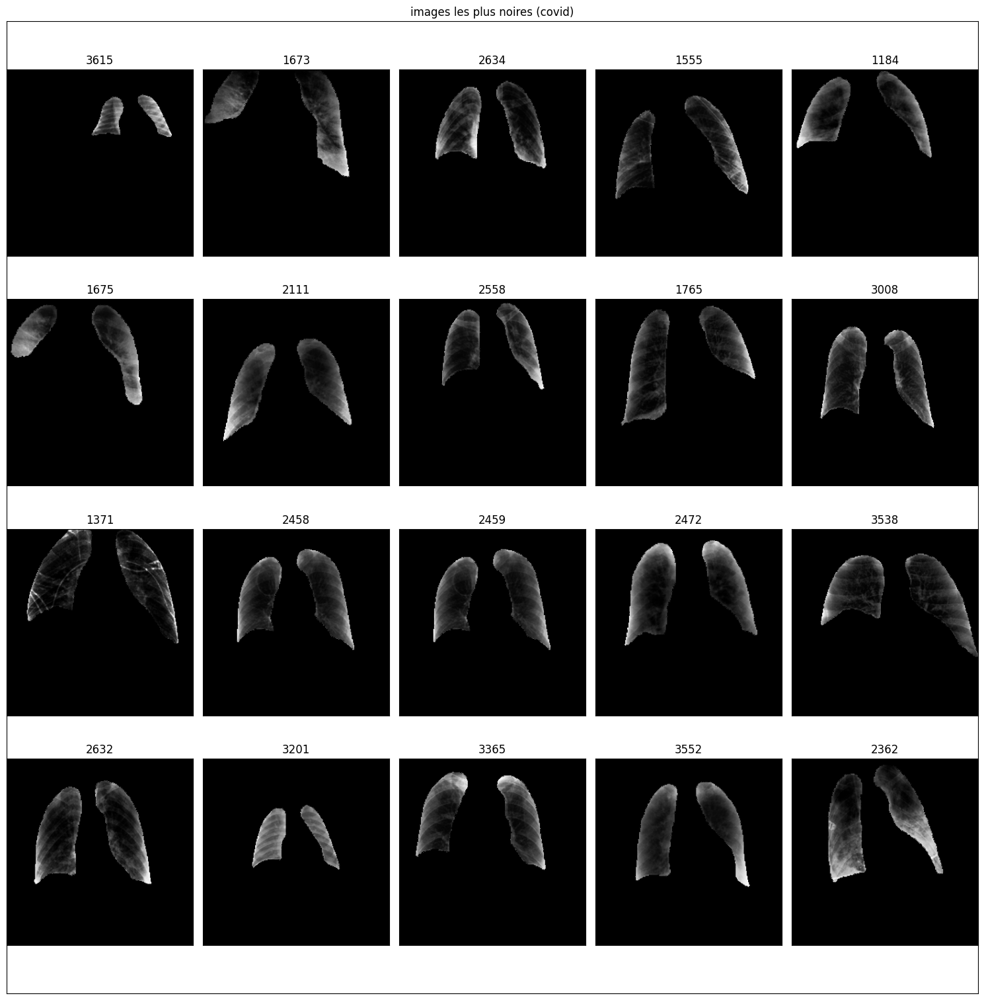

In [105]:
# detection des images ou il y a beaucoup de noir (covid)

fig =  plt.figure(figsize = (15,15))
plt.title("images les plus noires (covid)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

black_Covid=[]
for i in range(0, nb_files_Covid):
    
    black_Covid.append(sum(sum(all_img_Covid[:,:,i]>40)))

black_Covid_ids=np.argsort(black_Covid)[:20].tolist()

print(black_Covid_ids)
j=1

for i in black_Covid_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_Covid[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))  
    plt.tight_layout() 
    j=j+1

[4290, 3335, 2685, 148, 5091, 827, 4540, 4186, 907, 4530, 5613, 3061, 6004, 1251, 1755, 3898, 4716, 3312, 3388, 1211]


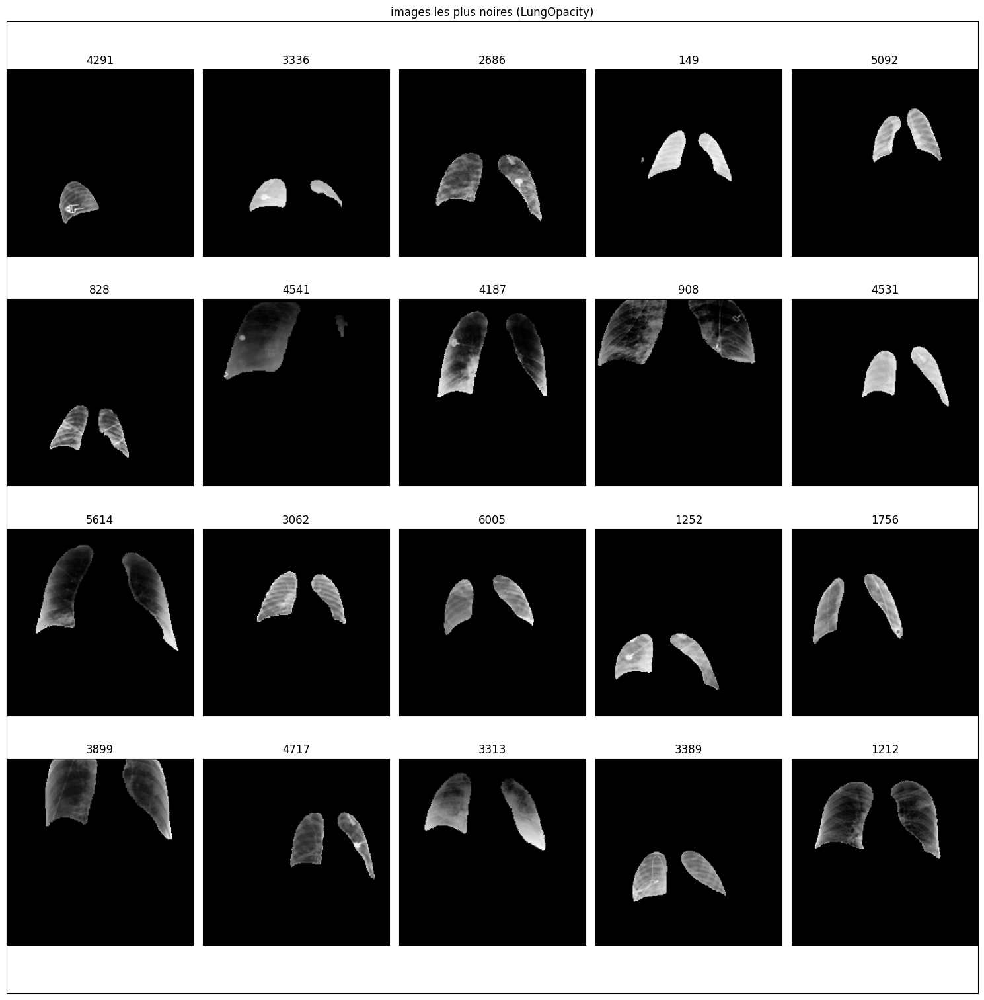

In [106]:
# detection des images ou il y a beaucoup de noir (LungOpacity)

fig =  plt.figure(figsize = (15,15))
plt.title("images les plus noires (LungOpacity)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

black_LungOpacity=[]
for i in range(0, nb_files_LungOpacity):
    
    black_LungOpacity.append(sum(sum(all_img_LungOpacity[:,:,i]>40)))

black_LungOpacity_ids=np.argsort(black_LungOpacity)[:20].tolist()

print(black_LungOpacity_ids)
j=1

for i in black_LungOpacity_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_LungOpacity[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1

[342, 136, 1196, 1011, 812, 454, 625, 596, 900, 1173, 40, 38, 782, 472, 1054, 1197, 957, 829, 1166, 1156]


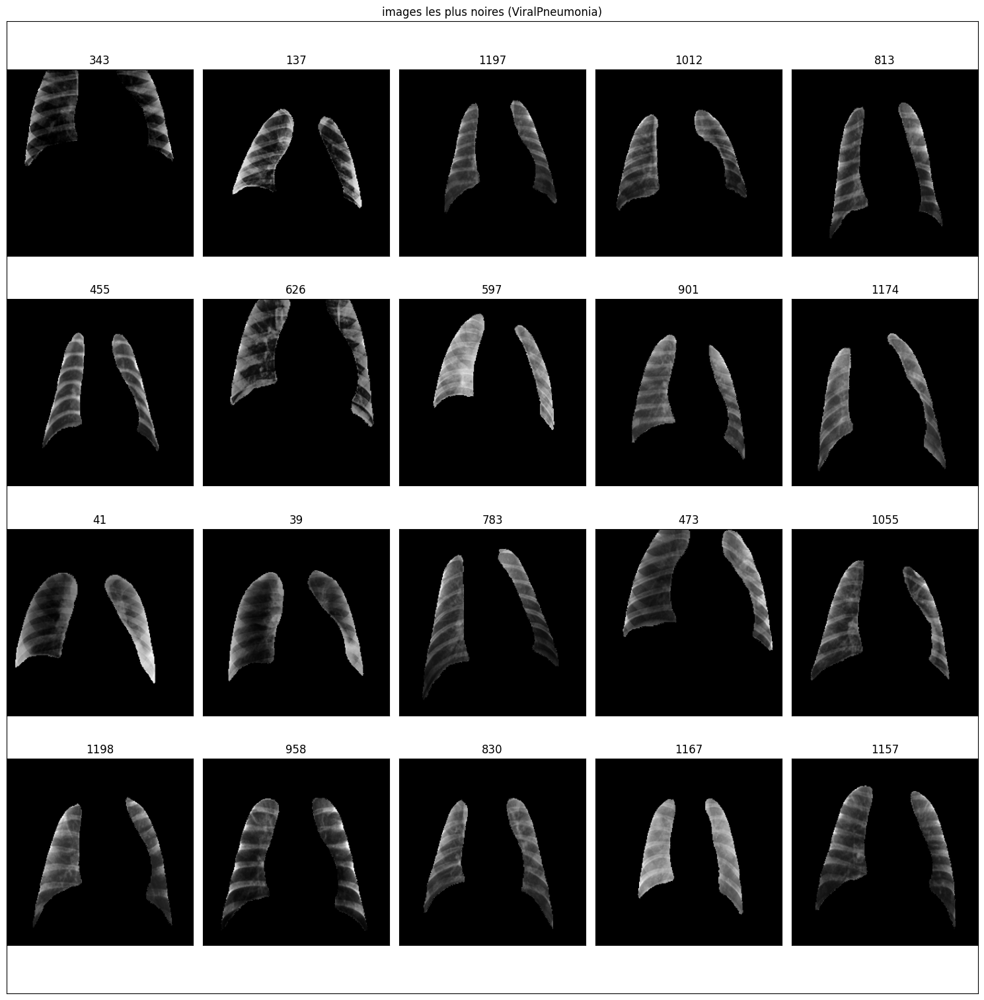

In [107]:
# detection des images ou il y a beaucoup de noir (ViralPneumonia)

fig =  plt.figure(figsize = (15,15))
plt.title("images les plus noires (ViralPneumonia)")
plt.xticks([]);
plt.yticks([]);
columns = 5
rows = 4

black_ViralPneumonia=[]
for i in range(0, nb_files_ViralPneumonia):
    
    black_ViralPneumonia.append(sum(sum(all_img_ViralPneumonia[:,:,i]>40)))

black_ViralPneumonia_ids=np.argsort(black_ViralPneumonia)[:20].tolist()

print(black_ViralPneumonia_ids)
j=1

for i in black_ViralPneumonia_ids:
    fig.add_subplot(rows, columns, j)
    plt.imshow(all_img_ViralPneumonia[:,:,i], cmap='gray');
    plt.xticks([]);
    plt.yticks([]);
    plt.title(str(i+1))
    plt.tight_layout()
    j=j+1